# Visualize how diffusion steps looks like
Diffusion is like Michelangelo who is told to to image sculpture in a stone and just let it out, removes what should not be there. Diffusion is imaging sculture based on your prompt (text or another image) and removes "noise".

We will see that trying to do so in single run is not very good, we need to let model try in smaller steps.

Resulting picture is grid with 5, 10, 20 and 40 steps to create image. More steps, slower "denoissing" leads to much better results.

In [1]:
from PIL import Image, ImageDraw

def image_grid(imgs, rows, cols, factor=1):
    assert len(imgs) == rows*cols

    w = int(imgs[0].size[0]/factor)
    h = int(imgs[0].size[1]/factor)
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    
    for i, img in enumerate(imgs):
        img = img.resize((w,h))
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid

In [ ]:
import torch
from diffusers import DiffusionPipeline
from diffusers.models import AutoencoderKL
import numpy as np

# model_id = "stabilityai/stable-diffusion-2-1"
model_id = "stabilityai/stable-diffusion-xl-base-1.0"

# Use the DPMSolverMultistepScheduler (DPM-Solver++) scheduler here instead
pipe = DiffusionPipeline.from_pretrained(model_id, 
                                        torch_dtype=torch.float16, 
                                        use_safetensors=True, 
                                        variant="fp16",
                                        add_watermarker = False)
pipe = pipe.to("cuda")

vae = AutoencoderKL.from_pretrained(model_id, subfolder="vae", use_safetensors=True, variant="fp16")
vae = vae.to("cuda")

prompt = "High resolution photo of beautiful woman with thick glasses and rainbow colored hat and colorful parrot sitting on her shoulder. Photographic lighting, professional portrait, 4k, blurred background, f2.0"
num_images_per_prompt=1
num_inference_steps=[5,10,20,40]
steps_results = []

def callback(iter, t, latents):
    steps_results.append(latents)

for num_steps in num_inference_steps:
    print(f"Running with {num_steps} steps")
    pipe(prompt=prompt, num_images_per_prompt=num_images_per_prompt, num_inference_steps=num_steps, callback=callback)

# image = pipe(prompt=prompt, num_images_per_prompt=num_images_per_prompt, num_inference_steps=num_inference_steps, callback=callback).images


In [8]:
# Convert all latent space steps into images
step_images = []
for step in steps_results:
    # Call decoder on scaled latents to get pixels
    latents = step.float()
    scaled_latents = 1 / 0.18215 * latents
    with torch.no_grad():
        imgs = vae.decode(scaled_latents)

    # Convert to numpy array
    img_array = np.array(imgs[0].cpu()) 

    # Clamp to 0,1 range
    img_array = np.clip(img_array / 2 + 0.5, 0, 1)

    # Transpose dimensions from (batchsize, channels, height, width) to (height, width, channels)
    img_array = img_array.transpose((0, 2, 3, 1))[0]

    # Scale to 0-255 range
    img_array = img_array * 255

    # Get Image
    step_images.append(Image.fromarray(np.uint8(img_array)).convert('RGB'))

In [9]:
# Add outputs to grid
grid = image_grid(step_images, rows=15, cols=5, factor=4)

# Save file
grid.save("steps.png")

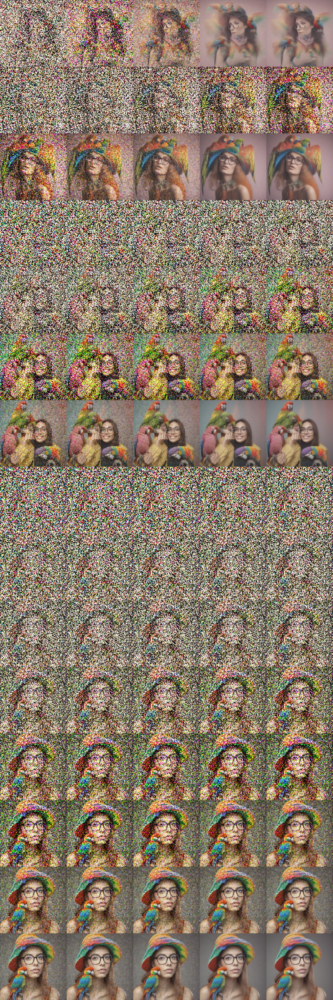

In [10]:
# Display grid in notebook
image = Image.open("steps.png")

# Display the image
image